In [1]:
# Required packages
import os
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib as mpl
from matplotlib import rcParams
import scipy as scipy
from scipy import io
import warnings
warnings.filterwarnings('ignore')
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
print (os.getcwd())
sc.settings.set_figure_params(scanpy=True, dpi=80, dpi_save=300, frameon=True, vector_friendly=True, fontsize=14)
rcParams['figure.figsize'] = 8, 8

-----
anndata     0.9.2
scanpy      1.9.8
-----
PIL                         10.0.1
anyio                       NA
asttokens                   NA
attr                        23.1.0
attrs                       23.1.0
babel                       2.11.0
backcall                    0.2.0
brotli                      1.0.9
certifi                     2023.11.17
cffi                        1.16.0
charset_normalizer          2.0.4
colorama                    0.4.6
comm                        0.1.2
cycler                      0.12.1
cython_runtime              NA
dateutil                    2.8.2
debugpy                     1.6.7
decorator                   5.1.1
defusedxml                  0.7.1
executing                   0.8.3
fastjsonschema              NA
gmpy2                       2.1.2
h5py                        3.10.0
idna                        3.4
igraph                      0.11.4
importlib_resources         NA
ipykernel                   6.25.0
jedi                        0.18.1
ji

In [2]:
#To expand width of jupyter notebook to fit the monitor
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [3]:
# To set the working directory:
os.chdir('C:/Users/Vaishnavi Gaad/Desktop/MS/Sem 2/Capstone Project/Testing')  # Provide the new path here
print (os.getcwd())

C:\Users\Vaishnavi Gaad\Desktop\MS\Sem 2\Capstone Project\Testing


In [4]:
# color palette
colors = ['#1f77b4', '#ff7f0e', '#279e68', '#d62728', '#aa40fc', '#8c564b',
'#e377c2', '#b5bd61', '#17becf', '#aec7e8', '#ffbb78', '#98df8a',
'#ff9896', '#c5b0d5', '#c49c94', '#f7b6d2', '#dbdb8d', '#9edae5',
'#ad494a', '#8c6d31', '#FF34FF', '#763568', '#63FFAC', '#B79762',
'#004D43', '#002dff', '#997D87', '#5A0007', '#809693', '#6A3A4C',
'#1B4400', '#4FC601', '#3B5DFF', '#4A3B53', '#FF2F80', '#61615A',
'#BA0900', '#6B7900', '#00C2A0', '#FFAA92', '#FF90C9', '#B903AA',
'#D16100', '#DDEFFF', '#000035', '#7B4F4B', '#A1C299', '#300018',
'#0AA6D8', '#013349', '#00846F', '#372101', '#FFB500', '#C2FFED',
'#A079BF', '#CC0744']

In [5]:
# open the object with all cells
adataall = sc.read_h5ad('Validation_dataset.h5ad') #Vaish
#adataall = sc.read_h5ad('saved_objects/allcells.h5ad')

# check annotations in this object and see which leiden clusters are annotated as 'T cells'

In [6]:
len(adataall.obs) #Vaish

165738

In [7]:
len(adataall.var)

32738

In [8]:
adataall

AnnData object with n_obs × n_vars = 165738 × 32738
    obs: 'UMAP_1', 'UMAP_2', 'cluster', 'annot', 'sample', 'patient', 'digest', 'typeSample', 'diet'
    var: 'gene_ids', 'feature_types'

In [9]:
adataall.obsm

AxisArrays with keys: 

In [10]:
mask = adataall.obs['typeSample'] == 'scRnaSeq'
adata_scRnaSeq = adataall[mask]
adata_scRnaSeq

View of AnnData object with n_obs × n_vars = 81939 × 32738
    obs: 'UMAP_1', 'UMAP_2', 'cluster', 'annot', 'sample', 'patient', 'digest', 'typeSample', 'diet'
    var: 'gene_ids', 'feature_types'

In [11]:
len(adata_scRnaSeq)

81939

In [12]:
# subset the T cell clusters
adata = adata_scRnaSeq[adata_scRnaSeq.obs['annot'].isin(['T cells'])] #Vaish
#adata = adataall[adataall.obs['leiden'].isin(['9','13'])]
adata
# note the number of cells should be much fewer than your original object here
# check that you have all the genes in this object (and not just variable genes)

View of AnnData object with n_obs × n_vars = 32166 × 32738
    obs: 'UMAP_1', 'UMAP_2', 'cluster', 'annot', 'sample', 'patient', 'digest', 'typeSample', 'diet'
    var: 'gene_ids', 'feature_types'

In [13]:
print(adata.raw)

None


In [14]:
len(adata.obs)

32166

In [15]:
len(adata.var)

32738

In [16]:
adata.obs

,UMAP_1,UMAP_2,cluster,annot,sample,patient,digest,typeSample,diet
cell,,,,,,,,,
AGAGCTTGTCTCCATC-5,12.455642,6.817911,17,T cells,CS31,H02,exVivo,scRnaSeq,Lean
ATCTGCCGTTCAGCGC-5,12.405866,4.155477,32,T cells,CS31,H02,exVivo,scRnaSeq,Lean
ATTACTCGTCTCTCGT-5,9.888982,1.995271,9,T cells,CS31,H02,exVivo,scRnaSeq,Lean
CATTATCGTTGAACTC-5,13.946509,6.079753,12,T cells,CS31,H02,exVivo,scRnaSeq,Lean
TAAGTGCAGACACTAA-5,10.002551,6.803090,15,T cells,CS31,H02,exVivo,scRnaSeq,Lean
...,...,...,...,...,...,...,...,...,...
GCCAGGTTCTTCCGTG-29,9.990335,4.899093,22,T cells,CS127,H25,exVivo,scRnaSeq,Lean
GTGACGCCATCCGAGC-29,12.787204,6.497910,17,T cells,CS127,H25,exVivo,scRnaSeq,Lean
GTGATGTCATTAGGAA-29,10.263852,2.690948,9,T cells,CS127,H25,exVivo,scRnaSeq,Lean


In [17]:
set(adata.obs.cluster) #Vaish #set(adata.obs.leiden)

{1, 3, 5, 6, 9, 10, 11, 12, 15, 16, 17, 19, 20, 22, 23, 32, 36, 40, 45, 49}

In [18]:
# checking QC parameters
# These columns not present for Vaish Val
# sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito'],
 #            jitter=0.4, size=0, multi_panel=True)

# normalization

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


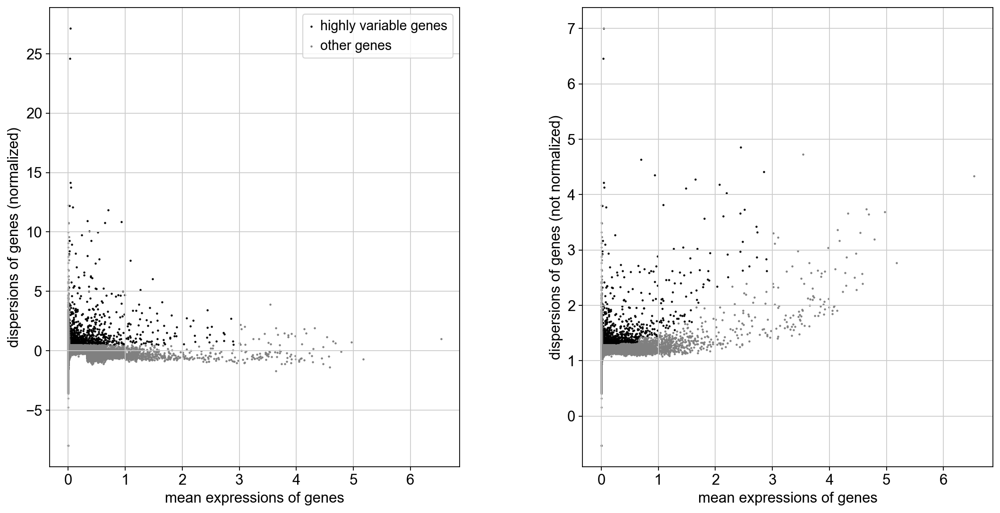

In [19]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
adata.uns['log1p']
sc.pl.highly_variable_genes(adata)

In [20]:
adata.raw = adata
# filter HVGs
adata = adata[:, adata.var['highly_variable']]
adata

View of AnnData object with n_obs × n_vars = 32166 × 1203
    obs: 'UMAP_1', 'UMAP_2', 'cluster', 'annot', 'sample', 'patient', 'digest', 'typeSample', 'diet'
    var: 'gene_ids', 'feature_types', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

In [21]:
# Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. 
# regress out can be done at the level of sub clustering so doing it here
# Scale the data to unit variance.
#sc.pp.regress_out(adata, ['n_counts', 'percent_mito']) # These columns not present for Vaish Val

In [22]:
# Scale each gene to unit variance. Clip values exceeding standard deviation 10.
sc.pp.scale(adata, max_value=10)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


## PCA

In [23]:
# Reduce the dimensionality of the data by running principal component analysis (PCA), 
# which reveals the main axes of variation and denoises the data.

sc.tl.pca(adata, svd_solver='arpack', n_comps=100)

computing PCA
    on highly variable genes
    with n_comps=100
    finished (0:00:44)


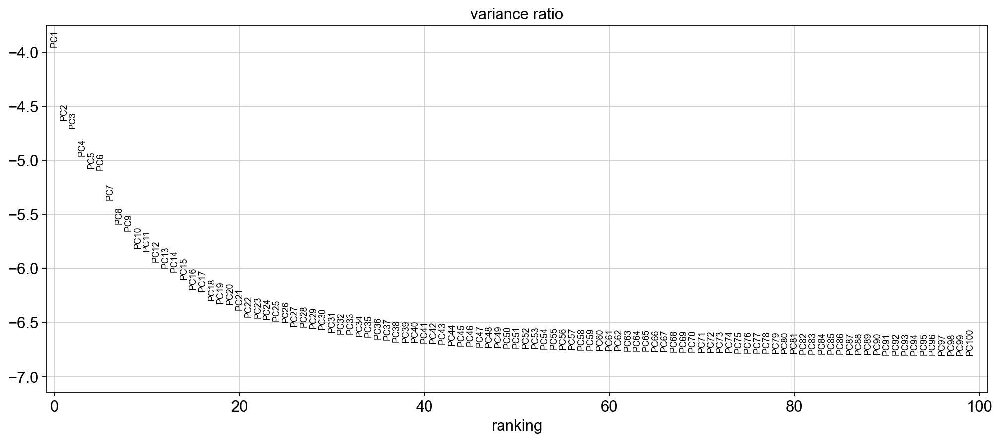

In [24]:
# Elbow plot
rcParams['figure.figsize'] = 15, 6
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=100, save="_T_elbowplot_UMAP.png")

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:39)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:31)
running Leiden clustering
    finished: found 17 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:07)


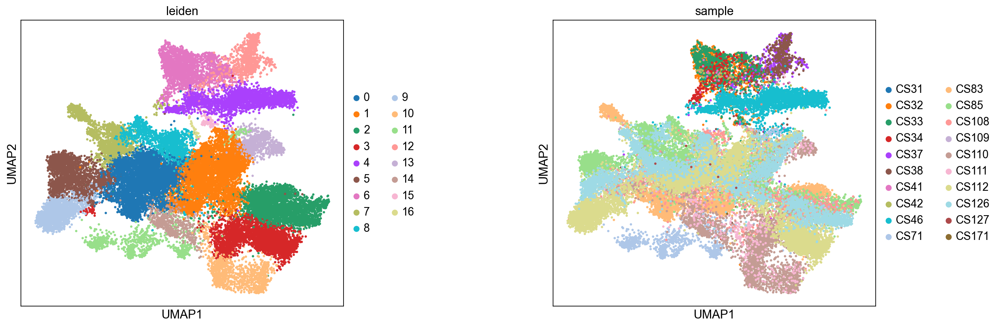

In [25]:
rcParams['figure.figsize'] = 6,6

sc.pp.neighbors(adata, knn=True, n_pcs=50) #n_pcs=20 Vaish
sc.tl.umap(adata)
sc.tl.leiden(adata, resolution=0.7) #resolution=0.5) Vaish
sc.pl.umap(adata, wspace = 0.5, size=30, color=["leiden", "sample"], palette=colors)

In [26]:
adata.obs

,UMAP_1,UMAP_2,cluster,annot,sample,patient,digest,typeSample,diet,leiden
cell,,,,,,,,,,
AGAGCTTGTCTCCATC-5,12.455642,6.817911,17,T cells,CS31,H02,exVivo,scRnaSeq,Lean,6
ATCTGCCGTTCAGCGC-5,12.405866,4.155477,32,T cells,CS31,H02,exVivo,scRnaSeq,Lean,6
ATTACTCGTCTCTCGT-5,9.888982,1.995271,9,T cells,CS31,H02,exVivo,scRnaSeq,Lean,6
CATTATCGTTGAACTC-5,13.946509,6.079753,12,T cells,CS31,H02,exVivo,scRnaSeq,Lean,6
TAAGTGCAGACACTAA-5,10.002551,6.803090,15,T cells,CS31,H02,exVivo,scRnaSeq,Lean,6
...,...,...,...,...,...,...,...,...,...,...
GCCAGGTTCTTCCGTG-29,9.990335,4.899093,22,T cells,CS127,H25,exVivo,scRnaSeq,Lean,8
GTGACGCCATCCGAGC-29,12.787204,6.497910,17,T cells,CS127,H25,exVivo,scRnaSeq,Lean,0
GTGATGTCATTAGGAA-29,10.263852,2.690948,9,T cells,CS127,H25,exVivo,scRnaSeq,Lean,1


In [27]:
adata.write('saved_objects/subset_Tcells_UMAP_pre-harmony.h5ad')

In [28]:
# map data quality
# sc.pl.umap(adata, wspace = 0.5, size=30, color=["leiden", "percent_mito", "n_counts", "n_genes"], palette=colors, cmap='Reds')
# These columns not present for Vaish Val

In [29]:
adata.write('saved_objects/subset_Tcells_UMAP_wo_contam_pre-harmony.h5ad')

selected PC - 50 #30 #20

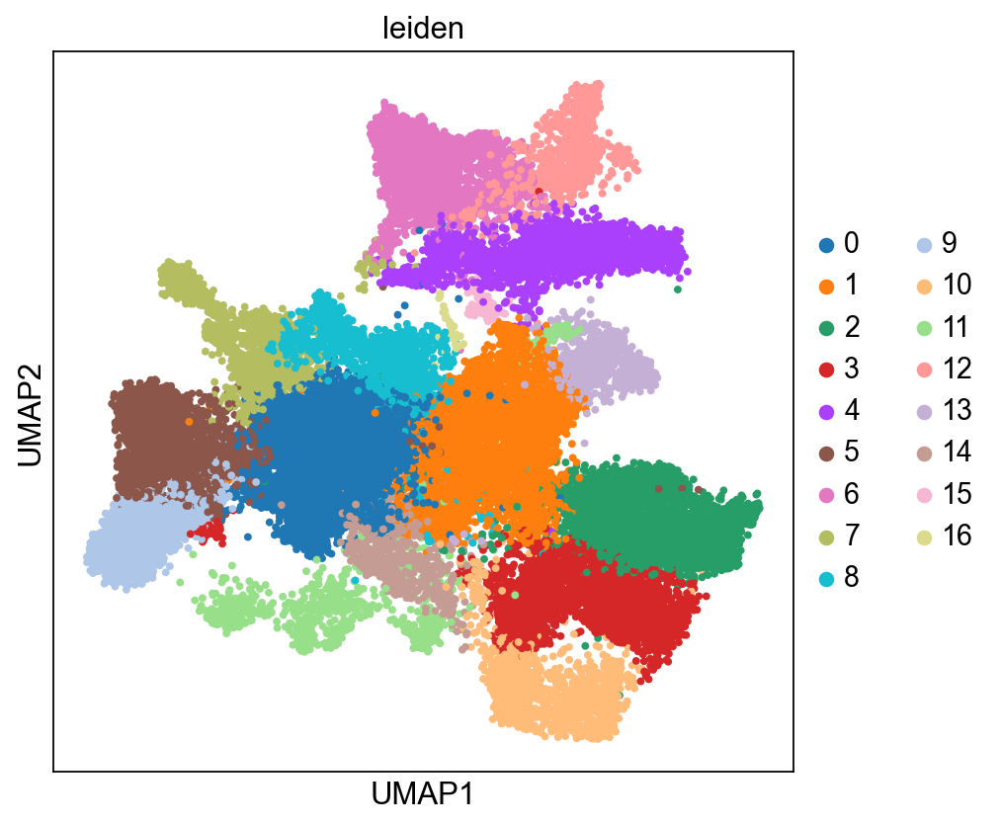

In [30]:
# sc.pl.umap(adata, wspace = 0.5, size=50, color=["leiden", "sample", 'TvsN', 'virus'], palette=colors, ncols=2)
# Vaish colour by leiden only
sc.pl.umap(adata, wspace = 0.5, size=50, color=['leiden'], palette=colors, ncols=2)

In [31]:
adata.write('saved_objects/subset_Tcells_UMAP_wo_contam_clusters.h5ad')

# DEG analysis

In [32]:
#NOT NEEDED ANYMORE
# Vaish changing the datatype of 'cluster' column to 'categorical'
'''
if not pd.api.types.is_categorical_dtype(adata.obs['cluster']):
    adata.obs['cluster'] = adata.obs['cluster'].astype('category')
    '''

"\nif not pd.api.types.is_categorical_dtype(adata.obs['cluster']):\n    adata.obs['cluster'] = adata.obs['cluster'].astype('category')\n    "

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:02:50)


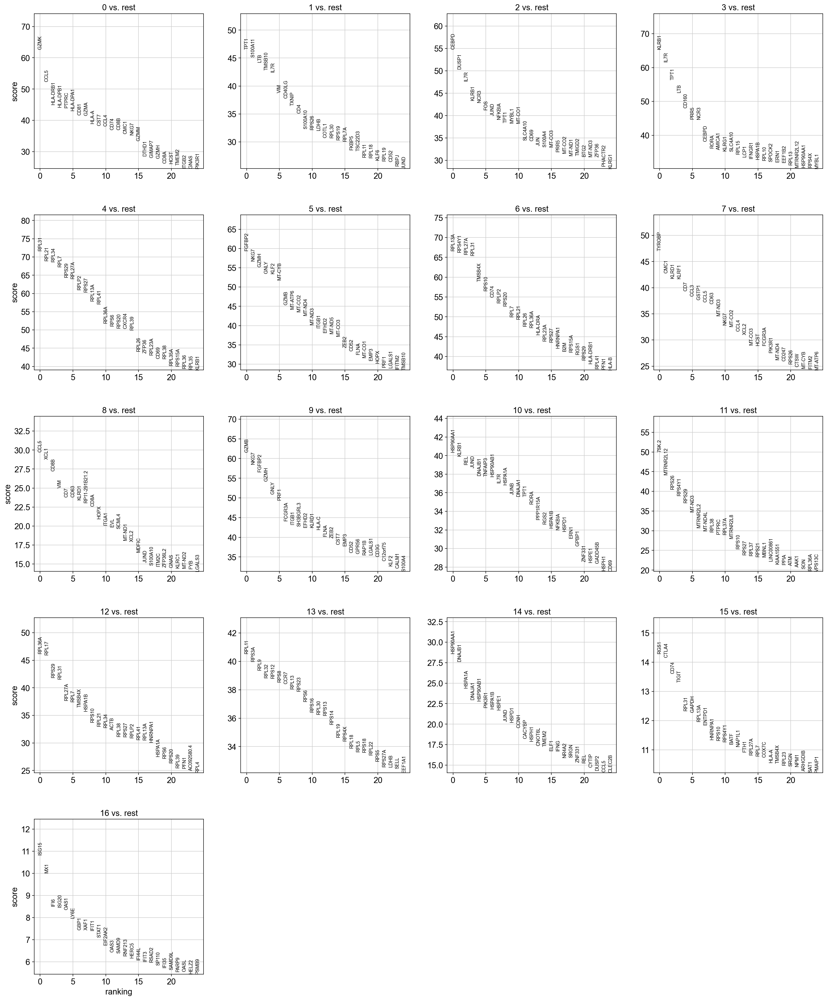

In [33]:
# DEGs 
# adata.uns['log1p']["base"] = None # run this if the below command throws - KeyError: 'base'
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon') 
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)


In [34]:
# saving DEGs to file
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
degs_by_cluster = pd.DataFrame({group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'scores', 'pvals_adj']})
degs_by_cluster.to_csv("T-cell_DEG.csv")
degs_by_cluster[:10]

,0_n,0_s,0_p,1_n,1_s,1_p,2_n,2_s,2_p,3_n,...,13_p,14_n,14_s,14_p,15_n,15_s,15_p,16_n,16_s,16_p
0,GZMK,62.698116,0.0,TPT1,46.558426,0.000000e+00,CEBPD,54.800159,0.0,KLRB1,...,0.000000e+00,HSP90AA1,28.619032,1.275194e-175,RGS1,14.295675,1.905656e-42,ISG15,10.834793,7.709683e-23
1,CCL5,52.347649,0.0,S100A11,45.171013,0.000000e+00,DUSP1,50.387280,0.0,IL7R,...,0.000000e+00,DNAJB1,27.636112,6.709502e-164,CTLA4,14.159422,1.069435e-41,MX1,10.020958,2.018326e-19
2,HLA-DRB1,45.017895,0.0,LTB,44.235268,0.000000e+00,IL7R,47.684898,0.0,TPT1,...,0.000000e+00,HSPA1A,24.389402,1.813403e-127,CD74,13.609852,1.636677e-38,IFI6,8.502170,2.030630e-13
3,HLA-DPB1,44.170143,0.0,TMSB10,42.850704,0.000000e+00,KLRB1,43.366047,0.0,LTB,...,0.000000e+00,DNAJA1,22.985893,4.223957e-113,TIGIT,13.307260,6.876438e-37,ISG20,8.463409,2.125295e-13
4,PTPRC,44.043396,0.0,IL7R,42.467220,0.000000e+00,NCR3,42.916855,0.0,CD160,...,0.000000e+00,HSP90AB1,22.828865,1.293337e-111,RPL31,12.339540,1.297184e-31,OAS1,8.347810,4.553240e-13
5,HLA-DPA1,43.127735,0.0,VIM,38.809639,0.000000e+00,FOS,41.292770,0.0,PRR5,...,0.000000e+00,PIK3R1,22.011156,1.053129e-103,GAPDH,12.281324,2.490585e-31,LY6E,7.970324,8.635140e-12
6,CD81,41.656433,0.0,CD40LG,37.810047,0.000000e+00,JUND,39.964687,0.0,NCR3,...,0.000000e+00,HSPA1B,21.855404,2.826007e-102,RPL13A,11.968139,1.004979e-29,GBP1,7.451997,4.098054e-10
7,GZMA,41.627853,0.0,TXNIP,36.509876,1.406014e-288,NFKBIA,39.134350,0.0,CEBPD,...,0.000000e+00,HSPE1,21.744011,2.863163e-101,ENTPD1,11.855311,3.480077e-29,XAF1,7.440715,4.098054e-10
8,HLA-A,39.019390,0.0,CD4,35.102283,1.018393e-266,TPT1,38.358150,0.0,RORA,...,0.000000e+00,JUND,20.334429,2.087941e-88,HNRNPA1,11.347603,1.071627e-26,IFIT1,7.405713,4.745124e-10
9,CST7,38.331932,0.0,S100A10,32.320362,5.387605e-226,MYBL1,38.306686,0.0,AMICA1,...,5.037789e-299,HSPD1,20.223671,1.803618e-87,RPS10,11.323126,1.320150e-26,STAT1,7.095580,4.217001e-09


# annotations

In [35]:
# Note Needed Anymore
'''
# Vaish repeating step due to an error
if not adata.obs['cluster'].dtype.name == 'category':
    adata.obs['cluster'] = adata.obs['cluster'].astype('category')
    '''

"\n# Vaish repeating step due to an error\nif not adata.obs['cluster'].dtype.name == 'category':\n    adata.obs['cluster'] = adata.obs['cluster'].astype('category')\n    "

    using 'X_pca' with n_pcs = 100
Storing dendrogram info using `.uns['dendrogram_leiden']`
categories: 0, 1, 2, etc.
var_group_labels: T cell genes, NK genes, Exhaustion, etc.


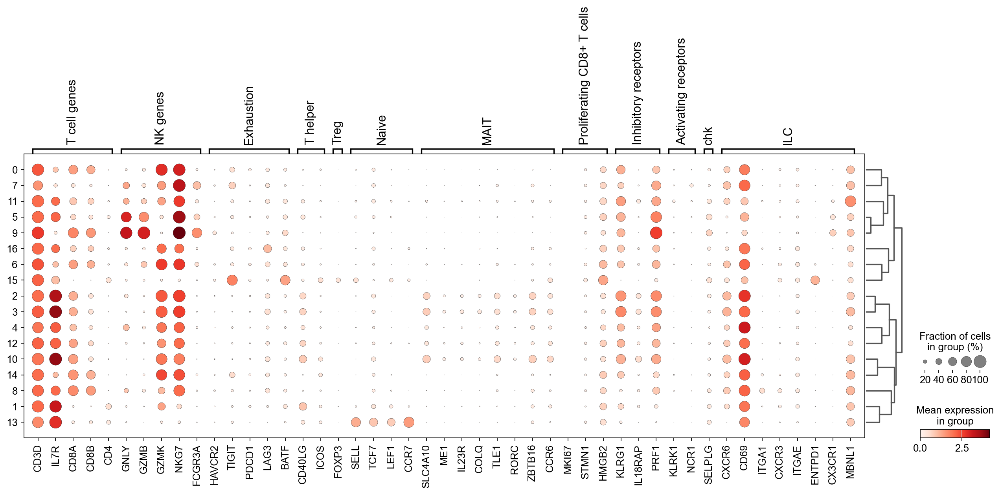

In [36]:
# dotplot to check different markers

marker_genes_dict = {
    'T cell genes' : ['CD3D','IL7R','CD8A','CD8B', "CD4"], # 'CD3G','CD3E'
    'NK genes' : ['GNLY','GZMB','GZMK','NKG7','FCGR3A'], # ,'GZMA','GZMK','PRF1', 'TYROBP','FCGR3A','FCGR3B','TRDC'
    'Exhaustion' : ['HAVCR2','TIGIT','PDCD1','LAG3','BATF'], 
    'T helper' : ['CD40LG','ICOS'], 
    'Treg' : ['FOXP3'],
    'Naive' : ['SELL','TCF7','LEF1','CCR7'],
    'MAIT' : ['SLC4A10', 'ME1',  'IL23R', 'COLQ', 'TLE1', 'RORC','ZBTB16','CCR6'],    
    'Proliferating CD8+ T cells' : ['MKI67','STMN1','HMGB2'], 
    'Inhibitory receptors' : ['KLRG1','IL18RAP','PRF1'],
    'Activating receptors' : ['KLRK1','NCR1'],
    'chk' : ['SELPLG'], # present on tumors more..kind of exhaustion marker
    'ILC' : ['CXCR6', 'CD69', 'ITGA1', 'CXCR3', 'ITGAE', 'ENTPD1', 'CX3CR1','MBNL1'],
    #'CD4-CTL': ['KLRG1','IL7R','CD8A','GZMA','GZMK','PRF1','TNF','NCR3']
}

'''
#Vaish Val
marker_genes_dict = {
    "CD4+ Cells": ["CD4", "IL7R"], # "TRBC2" not present in Vaish VAl
    "CD8+ Cells": ["CD8A", "CD8B", "GZMK", "GZMA", "CCL5", "GZMB", "GZMH", "GZMA"],
    'Tregs' : ['FOXP3']
}
'''

sc.tl.dendrogram(adata, groupby='leiden')
sc.pl.dotplot(adata, marker_genes_dict, groupby='leiden', dendrogram=True) #, dot_max=0.6, dot_min=0.05)

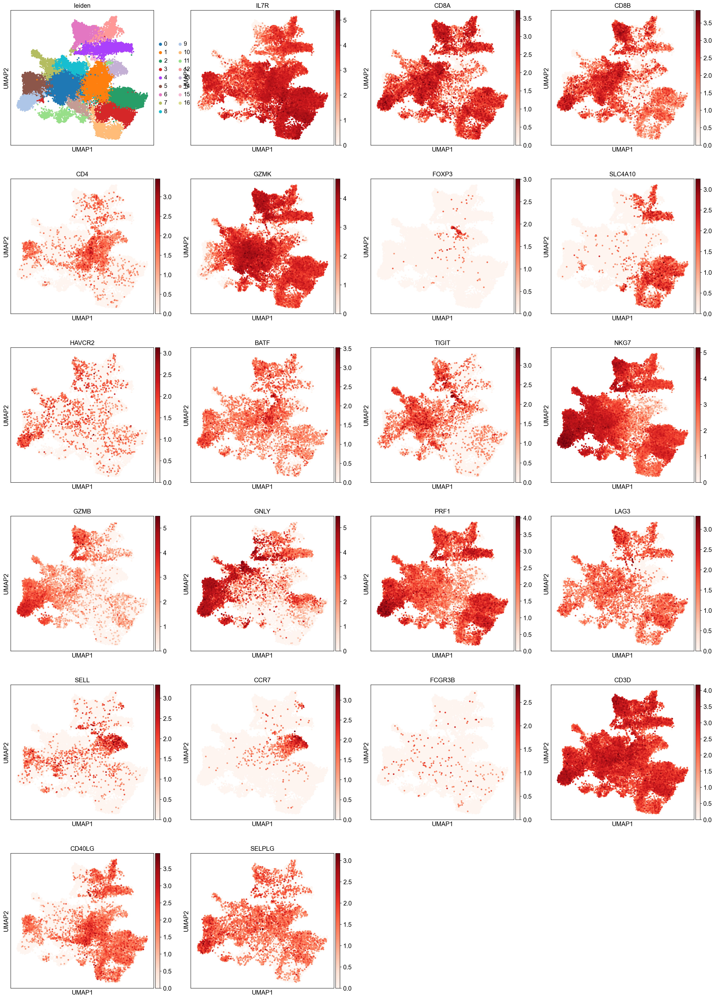

'\n#Vaish\nsc.pl.umap(adata, color=[\'leiden\', "CD4", "IL7R", \n                         "CD8A", "CD8B", "GZMK", "GZMA", "CCL5", "GZMB", "GZMH", "GZMA",\n                         \'FOXP3\'], size=50, cmap=\'Reds\')\n'

In [37]:
sc.pl.umap(adata, color=['leiden', 'IL7R', 'CD8A', 'CD8B','CD4', 'GZMK', 'FOXP3', 'SLC4A10', 'HAVCR2',
                        'BATF', 'TIGIT','NKG7','GZMB','GNLY','PRF1','LAG3', 'SELL', 'CCR7',
                        'FCGR3B','CD3D','CD40LG','SELPLG'], size=50, cmap='Reds')

'''
#Vaish
sc.pl.umap(adata, color=['leiden', "CD4", "IL7R", 
                         "CD8A", "CD8B", "GZMK", "GZMA", "CCL5", "GZMB", "GZMH", "GZMA",
                         'FOXP3'], size=50, cmap='Reds')
'''

0, 7, 5, 10, 11 - CD8+ Old
# 0, 7, 11, 5, 9, 6, 14 - CD8+

In [38]:
# add cell type labels
'''
hmm = adata.obs[['leiden']]
hmm['Specific_CellType'] = hmm.leiden.replace(['0'],'CD4 naive')
hmm['Specific_CellType'] = hmm.Specific_CellType.replace(['1'],'CD8 T cells')
hmm['Specific_CellType'] = hmm.Specific_CellType.replace(['2'],'MAITs')
hmm['Specific_CellType'] = hmm.Specific_CellType.replace(['3'],'CD8 T cells')
hmm['Specific_CellType'] = hmm.Specific_CellType.replace(['4'],'CD8 activated')
hmm['Specific_CellType'] = hmm.Specific_CellType.replace(['5'],'Treg')
hmm['Specific_CellType'] = hmm.Specific_CellType.replace(['6'],'CD4/CD8 T cells')
hmm['Specific_CellType'] = hmm.Specific_CellType.replace(['7'],'CD4 T cells')
hmm['Specific_CellType'] = hmm.Specific_CellType.replace(['8'],'CD8 exhausted')
hmm['Specific_CellType'] = hmm.Specific_CellType.replace(['9'],'CD8 proliferating')

adata.obs['Specific_CellType'] = hmm.Specific_CellType
'''

hmm = adata.obs[['leiden']]
hmm['T_cell_sub'] = hmm.leiden.replace(['0', '7', '11', '5', '9', '6', '14'],'CD8+ Cells')
adata.obs['T_cell_sub'] = hmm.T_cell_sub
adata.obs

,UMAP_1,UMAP_2,cluster,annot,sample,patient,digest,typeSample,diet,leiden,T_cell_sub
cell,,,,,,,,,,,
AGAGCTTGTCTCCATC-5,12.455642,6.817911,17,T cells,CS31,H02,exVivo,scRnaSeq,Lean,6,CD8+ Cells
ATCTGCCGTTCAGCGC-5,12.405866,4.155477,32,T cells,CS31,H02,exVivo,scRnaSeq,Lean,6,CD8+ Cells
ATTACTCGTCTCTCGT-5,9.888982,1.995271,9,T cells,CS31,H02,exVivo,scRnaSeq,Lean,6,CD8+ Cells
CATTATCGTTGAACTC-5,13.946509,6.079753,12,T cells,CS31,H02,exVivo,scRnaSeq,Lean,6,CD8+ Cells
TAAGTGCAGACACTAA-5,10.002551,6.803090,15,T cells,CS31,H02,exVivo,scRnaSeq,Lean,6,CD8+ Cells
...,...,...,...,...,...,...,...,...,...,...,...
GCCAGGTTCTTCCGTG-29,9.990335,4.899093,22,T cells,CS127,H25,exVivo,scRnaSeq,Lean,8,8
GTGACGCCATCCGAGC-29,12.787204,6.497910,17,T cells,CS127,H25,exVivo,scRnaSeq,Lean,0,CD8+ Cells
GTGATGTCATTAGGAA-29,10.263852,2.690948,9,T cells,CS127,H25,exVivo,scRnaSeq,Lean,1,1


In [39]:
adata_T_Cell = adata[adata.obs['T_cell_sub'].isin(['CD8+ Cells'])]
adata_T_Cell

View of AnnData object with n_obs × n_vars = 14201 × 1203
    obs: 'UMAP_1', 'UMAP_2', 'cluster', 'annot', 'sample', 'patient', 'digest', 'typeSample', 'diet', 'leiden', 'T_cell_sub'
    var: 'gene_ids', 'feature_types', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'sample_colors', 'rank_genes_groups', 'dendrogram_leiden'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [40]:
adata_T_Cell.obs

,UMAP_1,UMAP_2,cluster,annot,sample,patient,digest,typeSample,diet,leiden,T_cell_sub
cell,,,,,,,,,,,
AGAGCTTGTCTCCATC-5,12.455642,6.817911,17,T cells,CS31,H02,exVivo,scRnaSeq,Lean,6,CD8+ Cells
ATCTGCCGTTCAGCGC-5,12.405866,4.155477,32,T cells,CS31,H02,exVivo,scRnaSeq,Lean,6,CD8+ Cells
ATTACTCGTCTCTCGT-5,9.888982,1.995271,9,T cells,CS31,H02,exVivo,scRnaSeq,Lean,6,CD8+ Cells
CATTATCGTTGAACTC-5,13.946509,6.079753,12,T cells,CS31,H02,exVivo,scRnaSeq,Lean,6,CD8+ Cells
TAAGTGCAGACACTAA-5,10.002551,6.803090,15,T cells,CS31,H02,exVivo,scRnaSeq,Lean,6,CD8+ Cells
...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGAGGTGATCG-28,11.193080,5.563960,22,T cells,CS126,H25,exVivo,scRnaSeq,Lean,0,CD8+ Cells
TTTGTTGGTCCAATCA-28,13.692907,4.427784,12,T cells,CS126,H25,exVivo,scRnaSeq,Lean,7,CD8+ Cells
ACTTTGTTCTACCTTA-29,13.846424,2.302139,32,T cells,CS127,H25,exVivo,scRnaSeq,Lean,5,CD8+ Cells


In [41]:
adata_scRnaSeq.obs = adata_scRnaSeq.obs.join(adata_T_Cell.obs['T_cell_sub'].set_axis(adata_T_Cell.obs.index)) 
adata_scRnaSeq.obs

,UMAP_1,UMAP_2,cluster,annot,sample,patient,digest,typeSample,diet,T_cell_sub
cell,,,,,,,,,,
AGAGCTTGTCTCCATC-5,12.455642,6.817911,17,T cells,CS31,H02,exVivo,scRnaSeq,Lean,CD8+ Cells
ATCTGCCGTTCAGCGC-5,12.405866,4.155477,32,T cells,CS31,H02,exVivo,scRnaSeq,Lean,CD8+ Cells
ATTACTCGTCTCTCGT-5,9.888982,1.995271,9,T cells,CS31,H02,exVivo,scRnaSeq,Lean,CD8+ Cells
CAGCATAGTTATGTGC-5,0.270990,10.011661,27,Endothelial cells,CS31,H02,exVivo,scRnaSeq,Lean,NaN
CATTATCGTTGAACTC-5,13.946509,6.079753,12,T cells,CS31,H02,exVivo,scRnaSeq,Lean,CD8+ Cells
...,...,...,...,...,...,...,...,...,...,...
TTTACCAAGAGAGGTA-41,-3.674058,7.171934,41,Fibroblasts,CS171,H38,exVivo,scRnaSeq,Lean,NaN
TTTACCAGTATCGAAA-41,-4.356690,7.339135,41,Fibroblasts,CS171,H38,exVivo,scRnaSeq,Lean,NaN
TTTCCTCGTGAGGCAT-41,-3.759264,7.485170,41,Fibroblasts,CS171,H38,exVivo,scRnaSeq,Lean,NaN


In [42]:
adata_scRnaSeq.obs['T_cell_sub'].value_counts()

T_cell_sub
CD8+ Cells    14201
Name: count, dtype: int64

In [43]:
condition = adata_scRnaSeq.obs['T_cell_sub'].notna()
# Create a new column ('Cell Type') based on the condition
new_cell_type = np.where(condition, adata_scRnaSeq.obs['T_cell_sub'], adata_scRnaSeq.obs['annot'])
# Update the AnnData object with the new column
adata_scRnaSeq.obs['Cell Type'] = pd.Categorical(new_cell_type, categories=np.unique(new_cell_type))
# Print a summary of the updated AnnData object
adata_scRnaSeq.obs


,UMAP_1,UMAP_2,cluster,annot,sample,patient,digest,typeSample,diet,T_cell_sub,Cell Type
cell,,,,,,,,,,,
AGAGCTTGTCTCCATC-5,12.455642,6.817911,17,T cells,CS31,H02,exVivo,scRnaSeq,Lean,CD8+ Cells,CD8+ Cells
ATCTGCCGTTCAGCGC-5,12.405866,4.155477,32,T cells,CS31,H02,exVivo,scRnaSeq,Lean,CD8+ Cells,CD8+ Cells
ATTACTCGTCTCTCGT-5,9.888982,1.995271,9,T cells,CS31,H02,exVivo,scRnaSeq,Lean,CD8+ Cells,CD8+ Cells
CAGCATAGTTATGTGC-5,0.270990,10.011661,27,Endothelial cells,CS31,H02,exVivo,scRnaSeq,Lean,NaN,Endothelial cells
CATTATCGTTGAACTC-5,13.946509,6.079753,12,T cells,CS31,H02,exVivo,scRnaSeq,Lean,CD8+ Cells,CD8+ Cells
...,...,...,...,...,...,...,...,...,...,...,...
TTTACCAAGAGAGGTA-41,-3.674058,7.171934,41,Fibroblasts,CS171,H38,exVivo,scRnaSeq,Lean,NaN,Fibroblasts
TTTACCAGTATCGAAA-41,-4.356690,7.339135,41,Fibroblasts,CS171,H38,exVivo,scRnaSeq,Lean,NaN,Fibroblasts
TTTCCTCGTGAGGCAT-41,-3.759264,7.485170,41,Fibroblasts,CS171,H38,exVivo,scRnaSeq,Lean,NaN,Fibroblasts


In [44]:
adata_scRnaSeq.obs['Cell Type'].value_counts()

Cell Type
Myeloid              27256
T cells              17965
Nk Cells             16631
CD8+ Cells           14201
Hepatocytes           2556
Endothelial cells     1554
B cells               1328
Fibroblasts            448
Name: count, dtype: int64

In [45]:
filtered_adata = adata_scRnaSeq[adata_scRnaSeq.obs['Cell Type'] != 'T cells', :]
filtered_adata

View of AnnData object with n_obs × n_vars = 63974 × 32738
    obs: 'UMAP_1', 'UMAP_2', 'cluster', 'annot', 'sample', 'patient', 'digest', 'typeSample', 'diet', 'T_cell_sub', 'Cell Type'
    var: 'gene_ids', 'feature_types'

In [46]:
filtered_adata.obs['Cell Type'].value_counts()

Cell Type
Myeloid              27256
Nk Cells             16631
CD8+ Cells           14201
Hepatocytes           2556
Endothelial cells     1554
B cells               1328
Fibroblasts            448
Name: count, dtype: int64

In [47]:
filtered_adata.var

,gene_ids,feature_types
MIR1302-10,MIR1302-10,Gene Expression
FAM138A,FAM138A,Gene Expression
OR4F5,OR4F5,Gene Expression
RP11-34P13.7,RP11-34P13.7,Gene Expression
RP11-34P13.8,RP11-34P13.8,Gene Expression
...,...,...
AC145205.1,AC145205.1,Gene Expression
BAGE5,BAGE5,Gene Expression
CU459201.1,CU459201.1,Gene Expression
AC002321.2,AC002321.2,Gene Expression


In [48]:
if 'UMAP_1' in filtered_adata.obs and 'UMAP_2' in filtered_adata.obs:
    # Extract UMAP coordinates from 'obs'
    umap_coords = filtered_adata.obs[['UMAP_1', 'UMAP_2']].values

    # Assign UMAP coordinates to 'obsm' attribute
    filtered_adata.obsm['X_umap'] = umap_coords

    # Optionally, you can remove 'umap1' and 'umap2' from 'obs'
    filtered_adata.obs.drop(columns=['UMAP_1', 'UMAP_2'], inplace=True)

    # Print confirmation
    print("UMAP coordinates moved to 'obsm' successfully.")
else:
    print("UMAP coordinates ('umap1' and 'umap2') not found in 'obs'.")

UMAP coordinates moved to 'obsm' successfully.


In [49]:
filtered_adata.write('Validation_Correct.h5ad')